In [2]:
# Importing necessary libraries and iterating through the directory to print the path of each file
from google.colab import drive
import os
import zipfile

# Mount Google Drive
drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
# Import the dataset
import numpy as np
import pandas as pd

import os
for dirname, _, filenames in os.walk('/content/drive/MyDrive/NLPAssign2/sentimentanalysis/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/content/drive/MyDrive/NLPAssign2/sentimentanalysis/input/Tweets.csv


In [4]:
# Execute command to check NVIDIA GPU status
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [5]:
# Import Transformers Libraries
!pip install -q transformers
!pip install datasets
!pip install evaluate
!pip install rouge-score
!pip install py7zr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for rouge-score: filename=rouge_score-0.1.2-py3-none-any.whl size=24933 sha256=0e05e8e7684729a298e18466d4a86604b68decf657f3d6f7a8495760f306f623
  Stored in directory: /root/.cache/pip/wheels/5f/dd/89/461065a73be61a532ff8599a28e9beef17985c9e9c31e541b4
Successfully built rouge-score
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.6/67.6 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 37.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 411.2/411.2 kB 40.3 MB/s eta 0:00:00
     ━━

In [6]:
!pip install plotly


In [7]:
# Importing all important libraries

# Data Handling
import pandas as pd
import numpy as np
from datasets import Dataset, load_metric
import shutil
from collections import defaultdict

# Data Visualization
import plotly.express as px
import plotly.graph_objs as go
import plotly.subplots as sp
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.io as pio
from IPython.display import display
from plotly.offline import init_notebook_mode
import matplotlib.pyplot as plt
import seaborn as sns
init_notebook_mode(connected=True)

# Statistics & Mathematics
import scipy.stats as stats
import statsmodels.api as sm
from wordcloud import WordCloud, STOPWORDS
from scipy.stats import shapiro, skew, anderson, kstest, gaussian_kde,spearmanr
import math

# Transformers
import tensorflow as tf
from transformers import BertModel, BertTokenizer, AdamW, get_linear_schedule_with_warmup
from transformers import AutoModelForSequenceClassification
from transformers import TFAutoModelForSequenceClassification
from transformers import BertTokenizer, TFBertForSequenceClassification
from transformers import AutoTokenizer, AutoConfig
from scipy.special import softmax
from transformers import BartTokenizer, BartForConditionalGeneration
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments
from transformers import pipeline
from transformers import DataCollatorForSeq2Seq
import torch
import evaluate
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from torch import nn, optim

import time
import datetime
import gc
import random
from nltk.corpus import stopwords

import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler,random_split
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

import transformers
from transformers import BertForSequenceClassification, AdamW, BertConfig,BertTokenizer,get_linear_schedule_with_warmup


# Other NLP libraries
from textblob import TextBlob
from sklearn.feature_extraction.text import TfidfVectorizer
import re
import nltk
nltk.download('punkt')


# Hiding warnings
import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [8]:
# Set the device to GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [9]:
# Read the dataset
df =pd.read_csv(r'/content/drive/MyDrive/NLPAssign2/sentimentanalysis/input/Tweets.csv')

df.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)


In [10]:
# Display unique values in the 'airline_sentiment' column of the DataFrame
df['airline_sentiment'].unique()

array(['neutral', 'positive', 'negative'], dtype=object)

In [11]:
# Display unique values in the 'airline' column of the DataFrame
df['airline'].unique()

array(['Virgin America', 'United', 'Southwest', 'Delta', 'US Airways',
       'American'], dtype=object)

In [12]:
# Print dataframe values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14640 entries, 0 to 14639
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   tweet_id                      14640 non-null  int64  
 1   airline_sentiment             14640 non-null  object 
 2   airline_sentiment_confidence  14640 non-null  float64
 3   negativereason                9178 non-null   object 
 4   negativereason_confidence     10522 non-null  float64
 5   airline                       14640 non-null  object 
 6   airline_sentiment_gold        40 non-null     object 
 7   name                          14640 non-null  object 
 8   negativereason_gold           32 non-null     object 
 9   retweet_count                 14640 non-null  int64  
 10  text                          14640 non-null  object 
 11  tweet_coord                   1019 non-null   object 
 12  tweet_created                 14640 non-null  object 
 13  t

In [13]:
# Check NULL values
df.isna().sum()

tweet_id                            0
airline_sentiment                   0
airline_sentiment_confidence        0
negativereason                   5462
negativereason_confidence        4118
airline                             0
airline_sentiment_gold          14600
name                                0
negativereason_gold             14608
retweet_count                       0
text                                0
tweet_coord                     13621
tweet_created                       0
tweet_location                   4733
user_timezone                    4820
dtype: int64

In [14]:
airlines=['@VirginAmerica', '@United', '@Southwest', '@Delta', '@USAirways',
       '@American']

In [15]:
# Preprocesses the text by replacing mentions with '@user' and URLs with 'http'
def preprocess(text):
    new_text = []
    for t in text.split(" "):
        t = '@user' if (t.startswith('@') and len(t) > 1 and t not in airlines) else t
        t = 'http' if t.startswith('http') else t
        new_text.append(t)
    return " ".join(new_text)

In [16]:
# Create a list of columns to drop
columnsTodrob=["negativereason","negativereason_confidence","airline_sentiment_gold","negativereason_gold","tweet_coord"\
              ,"tweet_location","user_timezone"]

In [17]:
# Drop necessary columns
df = df.drop(columns=columnsTodrob)

In [18]:
df.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,airline,name,retweet_count,text,tweet_created
0,570306133677760513,neutral,1.0000,Virgin America,cairdin,0,@VirginAmerica What @dhepburn said.,2015-02-24 11:35:52 -0800
1,570301130888122368,positive,0.3486,Virgin America,jnardino,0,@VirginAmerica plus you've added commercials t...,2015-02-24 11:15:59 -0800
2,570301083672813571,neutral,0.6837,Virgin America,yvonnalynn,0,@VirginAmerica I didn't today... Must mean I n...,2015-02-24 11:15:48 -0800
3,570301031407624196,negative,1.0000,Virgin America,jnardino,0,@VirginAmerica it's really aggressive to blast...,2015-02-24 11:15:36 -0800
4,570300817074462722,negative,1.0000,Virgin America,jnardino,0,@VirginAmerica and it's a really big bad thing...,2015-02-24 11:14:45 -0800


In [19]:
df['text'].apply(lambda x:len(x.split(' '))).max()

36

In [20]:
# Create a histogram of airline sentiment
import plotly.io as pio
from IPython.display import HTML

fig = px.histogram(
    df["airline_sentiment"],
    nbins=25,
    title="Airline Sentiment",
    template="seaborn",
    labels={"value": "Airline Sentiment"},
    color=df["airline_sentiment"]
)
fig.update_traces(
    textfont={
        "size": 20,
        "family": "tahoma",
        "color": "#fff"
    },
    hovertemplate="Airline Sentiment: %{x}<br>Frequency: %{y}",
    marker=dict(line=dict(color='#000', width=0.1))
)

html_str = pio.to_html(fig)
HTML(html_str)


In [21]:
# Create a histogram of airline
fig = px.histogram(
    df["airline"],
    nbins=25,
    title= "airline",
    template="seaborn",
    labels={"value" :"airline"},
    color=df["airline"]
)
fig.update_traces(
    textfont = {
        "size" : 20,
        "family" :"tahoma",
        "color": "#fff"
    },
    hovertemplate = "airline: %{x}<br>Frequency: %{y}",
    marker=dict(line=dict(color='#000', width=0.1))
)

html_str = pio.to_html(fig)
HTML(html_str)

In [22]:
# Grouping the DataFrame by 'airline_sentiment' and 'airline', then counting the values and sorting by 'airline' in descending order
senline=df[['airline_sentiment', 'airline']].groupby(['airline_sentiment'], as_index=False).value_counts().sort_values(by='airline', ascending=False)

In [23]:
senline.head()

,airline_sentiment,airline,count
17,positive,Virgin America,152
5,negative,Virgin America,181
11,neutral,Virgin America,171
14,positive,United,492
7,neutral,United,697


In [24]:
# Cleaning tags from text after preprocessing and removing empty dialogues
def clean_tags(text):
    text=preprocess(text)
    clean = re.compile('<.*?>') # Compiling tags
    clean = re.sub(clean, '', text) # Replacing tags text by an empty string

    # Removing empty dialogues
    clean = '\n'.join([line for line in clean.split('\n') if not re.match('.*:\s*$', line)])

    return clean

In [25]:
# Creating a bar plot using Plotly Express
fig = px.bar(data_frame = senline,
             x = senline['airline'],
             y = senline['count'],
             color = senline['airline_sentiment'],
             title = "airline sentiment and airline",
             #color_discrete_sequence=["#45FFCA", "#D09CFA", "#FF9B9B"],
             labels= {"index" :"sentiment", "y": "airline in PCT(%)"},
             template="seaborn",
             text = senline['airline_sentiment']
            )


fig.update_traces(
    textfont = {
        "size" : 16,
        "family" :"arial",
        "color": "#222"
    },
    hovertemplate = "sentiment: %{x}<br>airline: %{y}",
)

html_str = pio.to_html(fig)
HTML(html_str)

In [26]:
# Grouping the DataFrame by 'airline_sentiment' and 'airline', then counting the values and sorting them
senline=df[['airline_sentiment', 'airline']].groupby(['airline_sentiment'], as_index=False).value_counts().sort_values(by='airline', ascending=False)

In [27]:
# Visualize the distribution of airline sentiments across different airlines using Plotly bar chart
fig = px.bar(data_frame = senline,
             x = senline['airline'],
             y = senline['count'],
             color = senline['airline_sentiment'],
             title = "airline sentiment and airline",
             #color_discrete_sequence=["#45FFCA", "#D09CFA", "#FF9B9B"],
             labels= {"index" :"sentiment", "y": "airline in PCT(%)"},
             template="seaborn",
             text = senline['airline_sentiment']
            )


fig.update_traces(
    textfont = {
        "size" : 16,
        "family" :"arial",
        "color": "#222"
    },
    hovertemplate = "sentiment: %{x}<br>airline: %{y}",
)

html_str = pio.to_html(fig)
HTML(html_str)

In [28]:
def generate_wordcloud(text,Title):
    all_text = " ".join(text)
    wordcloud = WordCloud(width=800,
                          height=400,
                          stopwords=set(STOPWORDS),
                          background_color='black').generate(all_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(Title)
    plt.show()

In [29]:
'''sent={"negative":0,
     "positive":1}'''
sent={"negative":0,
     "positive":2,
     "neutral":1}
df['airline_sentiment_encodded']=df["airline_sentiment"].map(sent)

In [30]:
df["cleaned_text"]=df["text"].apply(clean_tags)

In [34]:
test1 = clean_tags(df['text'].iloc[50]) # Applying function to example text

# Printing results
print(test1)

@VirginAmerica Is flight 769 on it's way? Was supposed to take off 30 minutes ago. Website still shows "On Time" not "In Flight". Thanks.


In [35]:
df.airline_sentiment_encodded.value_counts()

0    9178
1    3099
2    2363
Name: airline_sentiment_encodded, dtype: int64

In [36]:
df1=df[["cleaned_text","airline_sentiment_encodded"]].reset_index()

In [37]:
df1.head()

,index,cleaned_text,airline_sentiment_encodded
0,0,@VirginAmerica What @user said.,1
1,1,@VirginAmerica plus you've added commercials t...,2
2,2,@VirginAmerica I didn't today... Must mean I n...,1
3,3,@VirginAmerica it's really aggressive to blast...,0
4,4,@VirginAmerica and it's a really big bad thing...,0


In [38]:
x=df1["cleaned_text"]
y=df1["airline_sentiment_encodded"]

In [39]:
x.head()

0                      @VirginAmerica What @user said.
1    @VirginAmerica plus you've added commercials t...
2    @VirginAmerica I didn't today... Must mean I n...
3    @VirginAmerica it's really aggressive to blast...
4    @VirginAmerica and it's a really big bad thing...
Name: cleaned_text, dtype: object

In [40]:
# Import nltk for data cleaning
import nltk
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [41]:
# Function to clean text data by performing various preprocessing steps
# such as converting text to lowercase, removing non-alphanumeric characters,
# URLs, HTML tags, specified punctuation marks, stopwords, and emojis.
sw = stopwords.words('english')

def clean_text(text):

    text = text.lower()

    text = re.sub(r"[^a-zA-Z?.!,¿]+", " ", text) # replacing everything with space except (a-z, A-Z, ".", "?", "!", ",")

    text = re.sub(r"http\S+", "",text) #Removing URLs
    #text = re.sub(r"http", "",text)

    html=re.compile(r'<.*?>')

    text = html.sub(r'',text) #Removing html tags

    punctuations = '@#!?+&*[]-%.:/();$=><|{}^' + "'`" + '_'
    for p in punctuations:
        text = text.replace(p,'') #Removing punctuations

    text = [word.lower() for word in text.split() if word.lower() not in sw]

    text = " ".join(text) #removing stopwords

    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    text = emoji_pattern.sub(r'', text) #Removing emojis

    return text

In [42]:
df1['cleaned_text'] = df1['cleaned_text'].apply(lambda x: clean_text(x))

In [43]:
# Splitting the dataset into training and testing sets with a test size of 10%,
# ensuring reproducibility by setting a random state, and maintaining the original order of data.

train_df,test_df= train_test_split(df1, test_size=0.1, random_state=90,shuffle=False)

In [44]:
# Extracting cleaned text and corresponding labels from the training dataframe.
tweets = train_df.cleaned_text.values
labels = train_df['airline_sentiment_encodded'].values

In [45]:
# Load the BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

In [46]:
# Printing the original tweet.
print(' Original: ', tweets[5])
print()

# Print the sentence split into tokens.
print('Tokenized: ', tokenizer.tokenize(tweets[5]))
print()

# Print the sentence mapped to token ids.
print('Token IDs: ', tokenizer.convert_tokens_to_ids(tokenizer.tokenize(tweets[5])))

 Original:  virginamerica seriously would pay flight seats playing really bad thing flying va

Tokenized:  ['virgin', '##ame', '##rica', 'seriously', 'would', 'pay', 'flight', 'seats', 'playing', 'really', 'bad', 'thing', 'flying', 'va']

Token IDs:  [6261, 14074, 14735, 5667, 2052, 3477, 3462, 4272, 2652, 2428, 2919, 2518, 3909, 12436]


In [47]:
# Determine the maximum length of tokenized sentences for padding
max_len = 0

# For every sentence...
for sent in tweets:

    # Tokenize the text and add `[CLS]` and `[SEP]` tokens.
    input_ids = tokenizer.encode(sent, add_special_tokens=True)

    # Update the maximum sentence length.
    max_len = max(max_len, len(input_ids))

print('Max sentence length: ', max_len)

Max sentence length:  44


In [48]:
# Tokenize the input tweets, add special tokens, and create attention masks
input_ids = []
attention_masks = []

# For every tweet...
for tweet in tweets:
    encoded_dict = tokenizer.encode_plus(
                        tweet,                      # Sentence to encode.
                        add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                        max_length = max_len,           # Pad & truncate all sentences.
                        pad_to_max_length = True,
                        return_attention_mask = True,   # Construct attn. masks.
                        return_tensors = 'pt',     # Return pytorch tensors.
                   )

    # Add the encoded sentence to the list.
    input_ids.append(encoded_dict['input_ids'])

    # And its attention mask (simply differentiates padding from non-padding).
    attention_masks.append(encoded_dict['attention_mask'])

# Convert the lists into tensors.
input_ids = torch.cat(input_ids, dim=0)
attention_masks = torch.cat(attention_masks, dim=0)
labels = torch.tensor(labels)

# Print sentence 0, now as a list of IDs.
print('Original: ', tweets[0])
print('Token IDs:', input_ids[0])

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


Original:  virginamerica user said
Token IDs: tensor([  101,  6261, 14074, 14735,  5310,  2056,   102,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0])


In [49]:
# Combine the training inputs into a TensorDataset.
dataset = TensorDataset(input_ids, attention_masks, labels)

# Create a 90-10 train-validation split.

# Calculate the number of samples to include in each set.
train_size = int(0.8 * len(dataset))
# val_size = int(0.2 * len(dataset))
val_size = len(dataset)  - train_size
# test_size = int(0.05 * len(dataset))

# Divide the dataset by randomly selecting samples.
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])


print('{:>5,} training samples'.format(train_size))
print('{:>5,} validation samples'.format(val_size))
# print('{:>5,} test samples'.format(test_size))

10,540 training samples
2,636 validation samples


In [50]:
# The DataLoader needs to know our batch size for training, so we specify it here.
# For fine-tuning BERT on a specific task, a batch size of 16 or 32.
batch_size = 32

# Create the DataLoaders for our training and validation sets and take training samples in random order.
train_dataloader = DataLoader(
            train_dataset,  # The training samples.
            sampler = RandomSampler(train_dataset), # Select batches randomly
            batch_size = batch_size # Trains with this batch size.
        )

# For validation the order doesn't matter, so we'll just read them sequentially.
validation_dataloader = DataLoader(
            val_dataset, # The validation samples.
            sampler = SequentialSampler(val_dataset), # Pull out batches sequentially.
            batch_size = batch_size # Evaluate with this batch size.
        )

In [51]:
# Load BertForSequenceClassification, the pretrained BERT model with a single
# linear classification layer on top.
model = BertForSequenceClassification.from_pretrained(
    "bert-base-uncased", # 12-layer BERT model, with an uncased vocab.
    num_labels = 3,      # The number of output labels for binary classification.

    output_attentions = False,
    output_hidden_states = False,
)

model = model.to(device)

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [52]:
# Define the optimizer with a learning rate of 2e-5 and epsilon of 1e-8
optimizer = AdamW(model.parameters(),
                  lr = 2e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                  eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                )

In [53]:
# The BERT recommends between 2 and 4 number of training epochs.
# We chose to run for 4, but we'll see later that this may be over-fitting the
# training data.
epochs = 4

# Total number of training steps is [number of batches] x [number of epochs].
total_steps = len(train_dataloader) * epochs

# Create the learning rate scheduler.
scheduler = get_linear_schedule_with_warmup(optimizer,
                                            num_warmup_steps = 0, # Default value in run_glue.py
                                            num_training_steps = total_steps)

In [54]:
# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

In [55]:
def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    # Round to the nearest second.
    elapsed_rounded = int(round((elapsed)))
    # Format as hh:mm:ss
    return str(datetime.timedelta(seconds=elapsed_rounded))

In [78]:
# Training loop for fine-tuning the model on the training dataset and evaluating on the validation dataset

seed_val = 42
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)
training_stats = []

# Measure the total training time for the whole run.
total_t0 = time.time()

# For each epoch...
for epoch_i in range(0, epochs):

    # ========================================
    #               Training
    # ========================================
    # Perform one full pass over the training set.
    print("")
    print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
    print('Training...')
    # Measure how long the training epoch takes.
    t0 = time.time()
    total_train_loss = 0
    model.train()
    for step, batch in enumerate(train_dataloader):
        # Unpack this training batch from our dataloader.
        #
        # As we unpack the batch, we'll also copy each tensor to the device using the
        # `to` method.
        #
        # `batch` contains three pytorch tensors:
        #   [0]: input ids
        #   [1]: attention masks
        #   [2]: labels
        b_input_ids = batch[0].to(device)
        b_input_mask = batch[1].to(device)
        b_labels = batch[2].to(device)
        optimizer.zero_grad()
        output = model(b_input_ids,
                             token_type_ids=None,
                             attention_mask=b_input_mask,
                             labels=b_labels)
        loss = output.loss
        total_train_loss += loss.item()
        # Perform a backward pass to calculate the gradients.
        loss.backward()
        # Clip the norm of the gradients to 1.0.
        # This is to help prevent the "exploding gradients" problem.
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        # Update parameters and take a step using the computed gradient.
        # The optimizer dictates the "update rule"--how the parameters are
        # modified based on their gradients, the learning rate, etc.
        optimizer.step()
        # Update the learning rate.
        scheduler.step()

    # Calculate the average loss over all of the batches.
    avg_train_loss = total_train_loss / len(train_dataloader)

    # Measure how long this epoch took.
    training_time = format_time(time.time() - t0)
    print("")
    print("  Average training loss: {0:.2f}".format(avg_train_loss))
    print("  Training epcoh took: {:}".format(training_time))
    # ========================================
    #               Validation
    # ========================================
    # After the completion of each training epoch, measure our performance on
    # our validation set.
    print("")
    print("Running Validation...")
    t0 = time.time()
    # Put the model in evaluation mode--the dropout layers behave differently
    # during evaluation.
    model.eval()
    # Tracking variables
    total_eval_accuracy = 0
    best_eval_accuracy = 0
    total_eval_loss = 0
    nb_eval_steps = 0
    # Evaluate data for one epoch
    for batch in validation_dataloader:
        b_input_ids = batch[0].to(device)
        b_input_mask = batch[1].to(device)
        b_labels = batch[2].to(device)
        # Tell pytorch not to bother with constructing the compute graph during
        # the forward pass, since this is only needed for backprop (training).
        with torch.no_grad():
            output= model(b_input_ids,
                                   token_type_ids=None,
                                   attention_mask=b_input_mask,
                                   labels=b_labels)
        loss = output.loss
        total_eval_loss += loss.item()
        # Move logits and labels to CPU if we are using GPU
        logits = output.logits
        logits = logits.detach().cpu().numpy()
        label_ids = b_labels.to('cpu').numpy()
        # Calculate the accuracy for this batch of test sentences, and
        # accumulate it over all batches.
        total_eval_accuracy += flat_accuracy(logits, label_ids)
    # Report the final accuracy for this validation run.
    avg_val_accuracy = total_eval_accuracy / len(validation_dataloader)
    print("  Accuracy: {0:.2f}".format(avg_val_accuracy))
    # Calculate the average loss over all of the batches.
    avg_val_loss = total_eval_loss / len(validation_dataloader)
    # Measure how long the validation run took.
    validation_time = format_time(time.time() - t0)
    if avg_val_accuracy > best_eval_accuracy:
        torch.save(model, 'bert_model')
        best_eval_accuracy = avg_val_accuracy
    #print("  Validation Loss: {0:.2f}".format(avg_val_loss))
    #print("  Validation took: {:}".format(validation_time))
    # Record all statistics from this epoch.
    training_stats.append(
        {
            'epoch': epoch_i + 1,
            'Training Loss': avg_train_loss,
            'Valid. Loss': avg_val_loss,
            'Valid. Accur.': avg_val_accuracy,
            'Training Time': training_time,
            'Validation Time': validation_time
        }
    )
print("")
print("Training complete!")

print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))

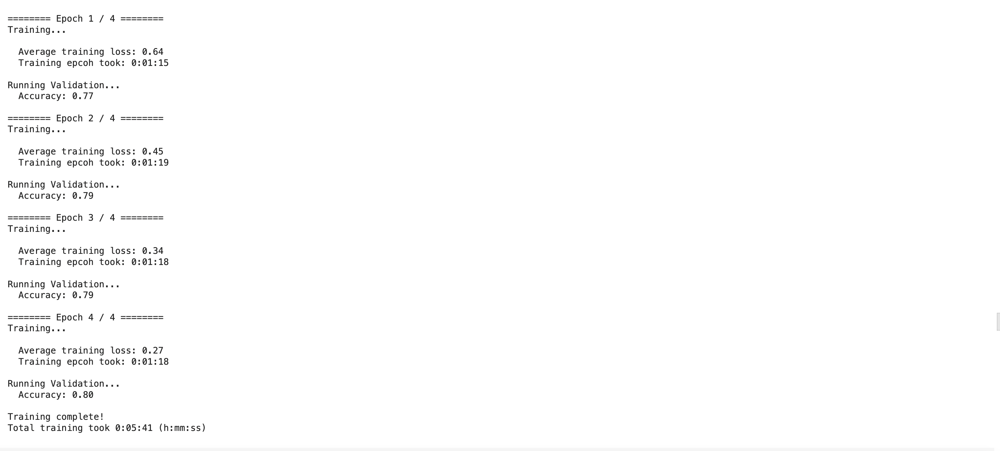

In [57]:
# Load the trained model for prediction
model = torch.load('/content/drive/MyDrive/NLPAssign2/sentimentanalysis/bert_model', map_location=torch.device('cpu'))

In [58]:
# Get the cleaned text from the test data for prediction
test_tweets = test_df['cleaned_text'].values

In [59]:
# Encode the test tweets for prediction
test_input_ids = []
test_attention_masks = []
for tweet in test_tweets:
    encoded_dict = tokenizer.encode_plus(
                        tweet,
                        add_special_tokens = True,
                        max_length = max_len,
                        pad_to_max_length = True,
                        return_attention_mask = True,
                        return_tensors = 'pt',
                   )
    test_input_ids.append(encoded_dict['input_ids'])
    test_attention_masks.append(encoded_dict['attention_mask'])
test_input_ids = torch.cat(test_input_ids, dim=0)
test_attention_masks = torch.cat(test_attention_masks, dim=0)

In [60]:
# Create a PyTorch dataset and dataloader for the test data
test_dataset = TensorDataset(test_input_ids, test_attention_masks)
test_dataloader = DataLoader(
            test_dataset, # The validation samples.
            sampler = SequentialSampler(test_dataset), # Pull out batches sequentially.
            batch_size = batch_size # Evaluate with this batch size.
        )

In [61]:
# Generate predictions for the test data
predictions = []
for batch in test_dataloader:
        b_input_ids = batch[0].to(device)
        b_input_mask = batch[1].to(device)
        with torch.no_grad():
            output= model(b_input_ids,
                                   token_type_ids=None,
                                   attention_mask=b_input_mask)
            logits = output.logits
            logits = logits.detach().cpu().numpy()
            pred_flat = np.argmax(logits, axis=1).flatten()

            predictions.extend(list(pred_flat))

In [62]:
# Create a DataFrame for the predictions and save it to a CSV file
df_output = pd.DataFrame()

df_output['target'] =predictions
df_output.to_csv('submission.csv',index=False)

In [63]:
df_output.head()

,target
0,0
1,0
2,2
3,0
4,0


In [64]:
test_df.cleaned_text[13176]

'user second flight put cancelled flightled explanation missed first meeting outraged'

In [65]:
text='user second flight put cancelled flightled explanation missed first meeting outraged'

In [66]:
import torch
import numpy as np

# Function to perform sentiment analysis on a given text using a trained model
# Returns the sentiment and confidence score
def product(text):
    sentiment = None
    confidence = None
    text = clean_text(text)
    encoded_dict = tokenizer.encode_plus(
        text,
        add_special_tokens=True,
        max_length=max_len,
        pad_to_max_length=True,
        return_attention_mask=True,
        return_tensors='pt',
    )
    test_input_ids = [encoded_dict['input_ids']]
    test_attention_masks = [encoded_dict['attention_mask']]
    test_input_ids = torch.cat(test_input_ids, dim=0).to(device)
    test_attention_masks = torch.cat(test_attention_masks, dim=0).to(device)
    with torch.no_grad():
        output = model(
            test_input_ids,
            token_type_ids=None,
            attention_mask=test_attention_masks
        )
        logits = output.logits
        logits = logits.detach().cpu().numpy()
        pred_flat = np.argmax(logits, axis=1).flatten()
        softmax = torch.nn.Softmax(dim=1)
        probabilities = softmax(output.logits)
        confidence = torch.max(probabilities).item()
        confidence = round(confidence, 2)  # rounding off to 3 decimal places
    if pred_flat == 0:
        print("Negative")
        sentiment = "negative"
    elif pred_flat == 2:
        print("Positive")
        sentiment = "Positive"
    else:
        print("Neutral")
        sentiment = "Neutral"
    return sentiment, confidence


In [67]:
product(text)

Negative


('negative', 1.0)

In [68]:
# Predict sentiment of below text
text='I can not believe that after everything we have been through in the past year and a half, they are STILL making us take our shoes off at the airport.'

In [69]:
product(text)

Negative


('negative', 0.99)

In [70]:
# Installing Flask and pyngrok packages for setting up the web server and tunneling

!pip install Flask==3.0.0 pyngrok==7.1.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.7/99.7 kB 2.4 MB/s eta 0:00:00
  Attempting uninstall: blinker
    Found existing installation: blinker 1.4
ERROR: Cannot uninstall 'blinker'. It is a distutils installed project and thus we cannot accurately determine which files belong to it which would lead to only a partial uninstall.


In [71]:
# Set the ngrok authentication token and the port number for the Flask app

ngrok_key = "2eBT7lSmnIaR0aTCQEPPVGUr9e8_2HtBC15AVHyk4ZNgckFJN"
port = 5000

In [72]:
# Connect ngrok to the specified port and get the public URL
from pyngrok import ngrok

ngrok.set_auth_token(ngrok_key)
ngrok.connect(port).public_url

'https://a96e-35-245-24-109.ngrok-free.app'

In [73]:
!pip install flask_cors

In [74]:
# This script defines a Flask web application that provides sentiment analysis and plots histograms of airline sentiment and airlines.
# It uses the PyTorch model for sentiment analysis and Plotly for data visualization.

from flask import Flask, request, jsonify
import plotly
from flask_cors import CORS

app = Flask(__name__)
CORS(app)  # This will enable CORS for all routes

@app.route('/getsentiment', methods=['POST'])
def sentiment_checker():
  corrected_text = None
  input=request.get_json()

  # Split the input sentence into sentences
  input_sentence = input["sentence"]
  # sentiment = None
  print("input_sentence", input_sentence)

  sentiment, confidence = product(input_sentence)

  print("sentiment", sentiment)
  # Return the corrected text as JSON response
  return {"sentiment": sentiment, "confidence": confidence}

@app.route('/plot-data-hist-al-sentiment', methods=['POST'])
def plot_data():
    fig = px.histogram(
        df,
        x="airline_sentiment",
        nbins=25,
        title="Airline Sentiment Histogram",
        template="plotly",
        labels={"airline_sentiment": "Airline Sentiment"},
        color="airline_sentiment"
    )
    fig.update_traces(
        textfont={
            "size": 20,
            "family": "tahoma",
            "color": "#fff"
        },
        hovertemplate="Airline Sentiment: %{x}<br>Frequency: %{y}",
        marker=dict(line=dict(color='#000', width=0.1))
    )

    graphJSON = plotly.io.to_json(fig, pretty=True)

    return graphJSON

@app.route('/plot-data-hist-al', methods=['POST'])
def plot_data_al():
    fig = px.histogram(
        df["airline"],
        nbins=25,
        title= "Airline Histogram",
        template="ggplot2",
        labels={"value" :"airline"},
        color=df["airline"]
    )
    fig.update_traces(
        textfont = {
            "size" : 20,
            "family" :"tahoma",
            "color": "#fff"
        },
        hovertemplate = "airline: %{x}<br>Frequency: %{y}",
        marker=dict(line=dict(color='#000', width=0.1))
    )
    graphJSON = plotly.io.to_json(fig, pretty=True)

    return graphJSON


@app.route('/plot-data-hist-al-bar', methods=['POST'])
def plot_data_al_bar():
    fig = px.bar(data_frame = senline,
            x = senline['airline'],
            y = senline['count'],
            color = senline['airline_sentiment'],
            title = "Airline sentiment and airline bar graph",
            #color_discrete_sequence=["#45FFCA", "#D09CFA", "#FF9B9B"],
            labels= {"index" :"sentiment", "y": "airline in PCT(%)"},
            template="seaborn",
            text = senline['airline_sentiment']
            )

    fig.update_traces(
        textfont = {
            "size" : 16,
            "family" :"arial",
            "color": "#222"
        },
        hovertemplate = "sentiment: %{x}<br>airline: %{y}",
    )
    graphJSON = plotly.io.to_json(fig, pretty=True)

    return graphJSON

if __name__ == '__main__':
    app.run(port = port)

 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit


input_sentence Three Idiots’ is a remarkable ahead of its time Bollywood blockbuster. This film is a comedy movie with strong acting, memorable characters, a perplexing storyline and most importantly, highly motivational movie to choose the right path in your life.


INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:39:17] "POST /getsentiment HTTP/1.1" 200 -


Positive
sentiment Positive
input_sentence And yet Interstellar is still an impressive, at times astonishing movie that overwhelmed me to the point where my usual objections to Nolan's work melted away. I’ve packed the first paragraph of this review with those objections (they could apply to any Nolan picture post Batman Begins; he is who he is) so that people know that he’s still doing the things that Nolan always does. Whether you find those things endearing or irritating will depend on your affinity for Nolan's style. 


INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:40:15] "POST /getsentiment HTTP/1.1" 200 -


Negative
sentiment negative


INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:40:53] "POST /plot-data-hist-al-bar HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:41:23] "POST /plot-data-hist-al HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:41:45] "POST /plot-data-hist-al-sentiment HTTP/1.1" 200 -


input_sentence And yet Interstellar is still an impressive, at times astonishing movie that overwhelmed me to the point where my usual objections to Nolan's work melted away. I’ve packed the first paragraph of this review with those objections (they could apply to any Nolan picture post Batman Begins; he is who he is) so that people know that he’s still doing the things that Nolan always does. Whether you find those things endearing or irritating will depend on your affinity for Nolan's style. 


INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:42:10] "POST /getsentiment HTTP/1.1" 200 -


Negative
sentiment negative
input_sentence And yet Interstellar is still an impressive, at times astonishing movie that overwhelmed me to the point where my usual objections to Nolan's work melted away. I’ve packed the first paragraph of this review with those objections (they could apply to any Nolan picture post Batman Begins; he is who he is) so that people know that he’s still doing the things that Nolan always does. Whether you find those things endearing or irritating will depend on your affinity for Nolan's style. 


INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:42:12] "POST /getsentiment HTTP/1.1" 200 -


Negative
sentiment negative
input_sentence I love it 


INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:42:20] "POST /getsentiment HTTP/1.1" 200 -


Positive
sentiment Positive
input_sentence I'm not sure but i like  it 


INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:42:31] "POST /getsentiment HTTP/1.1" 200 -


Positive
sentiment Positive
input_sentence Kahaani is one of the movies which knows how to clutch viewers interest and attention very well. From the frightening starting to the unpredictable ending, it proves successful to impress the viewer. The scripting, casting and writing is just fabulous. Every actor gave justification to his/her role , especially Vidya Balan portraying every emotion to the point. The story is highly intriguing , a treat for suspense thriller lovers.


INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:43:39] "POST /getsentiment HTTP/1.1" 200 -


Positive
sentiment Positive
input_sentence This is one of the movies where all your predictions go wrong. You think whatever that's gonna happen is predictable but in the end, something unimaginable happens with a 180-degree plot twist. Great work by Sujoy Ghosh.


INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:44:07] "POST /getsentiment HTTP/1.1" 200 -


Negative
sentiment negative


INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:45:13] "POST /getsentiment HTTP/1.1" 200 -


input_sentence From sketch to sky, we can't wait to introduce the look of our new cabin. We are ready to take off into the future, are you? Lufthansa Allegris, premiering in 2023.
Neutral
sentiment Neutral
input_sentence One such an example: I asked an airline representative where I could fill my water bottle in Frankfurt, he replied by saying ‘Do I look like the information desk to you, don't ask me


INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:45:50] "POST /getsentiment HTTP/1.1" 200 -


Negative
sentiment negative
input_sentence Lufthansa sucks. Priority baggage and not offloaded in an hour of landing. Delhi staff says, everyday affair,


INFO:werkzeug:127.0.0.1 - - [29/Mar/2024 05:46:19] "POST /getsentiment HTTP/1.1" 200 -


Negative
sentiment negative
